##Complex-valued Perceptron
In this section, we want to implement a single-layer perceptron for solving the XOR problem with #1 complex-valued neuron and siglog activation function. This work was fully explained in the below paper:

[1] T. Nitta, “Solving the XOR problem and the detection of symmetry using a single complex-valued neuron,” Neural Networks, vol. 16, no. 8, pp. 1101–1105, Oct. 2003, doi: 10.1016/S0893-6080(03)00168-0.

we compare our work with two-layer real valued neural network which have the sigmoid activation function as the non-linearity function.

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation

In [ ]:
# Initialize weights and bias with complex values
# W = np.array([np.random.randn() + 1j * np.random.randn()])
W = np.array([1+1j])
# b = np.random.randn() + 1j * np.random.randn()
b = np.array([1+1j])

# Learning rate
eta = 0.1

In [ ]:
W

array([1.+1.j])

In [ ]:
# Activation function (complex siglog)
def siglog(z):
    return z / (1 + np.abs(z))

# Derivative of the sigmoid function
def siglog_derivative(z):
    return (1+0.5*np.abs(z))/(1+np.abs(z))**2

def siglog_derivative_conj(z):
    return -0.5*(z**2/np.abs(z))/(1+np.abs(z))**2

In [ ]:
# Training data (XOR inputs and outputs)
inputs = np.array([1+1j, 1-1j, -1+1j, -1-1j])
targets = np.array([1j, 1+1j, 0, 1])

In [ ]:
# Training loop with tracking
weights , biases = [], []
for epoch in range(10000):  # Reduced the number of epochs for brevity
    print(f"Epoch {epoch + 1}")
    for x, t in zip(inputs, targets):
        initial_W = W.copy()
        initial_b = b.copy()

        # Forward pass
        # z = np.dot(W, x) + b
        z = np.dot(W, x)
        y = siglog(z)

        weights.append(initial_W)
        # biases.append(initial_b)

        # Compute loss
        loss = 0.5 * np.abs(y - t) ** 2

        # Compute gradients using Wirtinger derivatives
        dL_dW = 0.5 * (y.conjugate() - t) * siglog_derivative_conj(z) * x.conjugate() + 0.5 * (y - t) * siglog_derivative(z).conjugate() * x.conjugate()
        # dL_db = 0.5 * (y.conjugate() - t) * siglog_derivative_conj(z) + 0.5 * (y - t) * siglog_derivative(z).conjugate()

        # Update weights and bias
        W -= eta * dL_dW
        # b -= eta * dL_db


        # Print tracking information
        print(f"Input: {x}")
        print(f"Target: {t}")
        print(f"Output:{y}")
        print(loss)
        print(f"Initial Weights: {initial_W}")
        print(f"Initial Bias: {initial_b}")
        print(f"Updated Weights: {W}")
        print(f"Updated Bias: {b}")
        print(f"Gradients (weights): {dL_dW}")
        print(f"Gradients (bias): {dL_db}")
        print("-----")
    print("======")

# Test the trained perceptron
for x in inputs:
    # z = np.dot(W, x) + b
    z = np.dot(W, x)
    y = siglog(z)
    print(f"Input: {x}, Output: {y}")

Streaming output truncated to the last 5000 lines.
Updated Weights: [0.9006067+37.72328887j]
Updated Bias: [5.57194828+3.02631766j]
Gradients (weights): [-0.00901243-0.00870145j]
Gradients (bias): [-0.00453282-0.01392057j]
-----
Input: (-1+1j)
Target: 0j
Output:[-0.7104684-0.67733592j]
[0.48177465]
Initial Weights: [0.9006067+37.72328887j]
Initial Bias: [5.57194828+3.02631766j]
Updated Weights: [0.90060614+37.72326539j]
Updated Bias: [5.57194828+3.02631766j]
Gradients (weights): [5.60533076e-06+0.00023479j]
Gradients (bias): [-0.00453282-0.01392057j]
-----
Input: (-1-1j)
Target: (1+0j)
Output:[0.67733592-0.71046839j]
[0.30443872]
Initial Weights: [0.90060614+37.72326539j]
Initial Bias: [5.57194828+3.02631766j]
Updated Weights: [0.89966482+37.72328089j]
Updated Bias: [5.57194828+3.02631766j]
Gradients (weights): [0.00941315-0.00015495j]
Gradients (bias): [-0.00453282-0.01392057j]
-----
Epoch 393
Input: (1+1j)
Target: 1j
Output:[-0.67735364+0.71045149j]
[0.27132315]
Initial Weights: [0.8

In [ ]:
W

array([0.90056751+37.01951972j])

In [ ]:
np.abs(1+1j)**2

2.0000000000000004

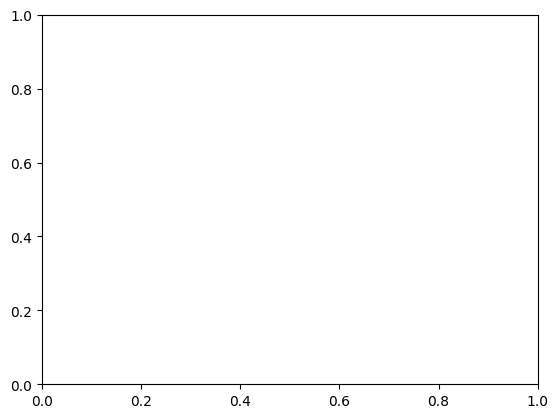

In [ ]:
fig, ax = plt.figure(), plt.axes()
def init():
    ax.set_xlim(-5, 5)
    ax.set_ylim(-5, 5)
    ax.set_xlabel("Real")
    ax.set_ylabel("Imag")

    return []

def update(frame):
    ax.clear()

    init()

    x= np.linspace(-2, 2, 500)
    y = np.linspace(-2, 2, 500)
    h = x + 1j*y
    # X, Y = np.meshgrid(x, y)

    ax.plot([inputs.real[0], inputs.real[3]],[inputs.imag[0], inputs.imag[3]], 'ro', [inputs.real[1], inputs.real[2]],[inputs.imag[1], inputs.imag[2]], 'bo')
    ax.grid(True)

    W = weights[frame]
    # print(W)
    b = biases[frame]

    out = W * h
    # out = siglog(out)
    # out_conj = W.conjugate() * h + b.conjugate()
    # out_conj = siglog(out_conj)

    ax.plot(x, out.real)
    ax.plot(y, out.imag)
    ax.grid(True)


    return []

In [ ]:
weights[0]


array([1.+1.j])

In [ ]:
ani = animation.FuncAnimation(fig, update, frames=500, init_func=init, blit=True, interval=20)
from IPython.display import HTML
HTML(ani.to_jshtml())

##Real-valued Neural Network

In [ ]:
# Sigmoid function and its derivative
def sigmoid(x):
    return 1 / (1 + np.exp(-x))

def sigmoid_derivative(x):
    return sigmoid(x) * (1 - sigmoid(x))

In [ ]:
# XOR input and output
inputs = np.array([[0, 0], [0, 1], [1, 0], [1, 1]])
targets = np.array([[0], [1], [1], [0]])

In [ ]:
# Initialize weights and biases
np.random.seed(42)  # For reproducibility
input_size = 2
hidden_size = 2
output_size = 1

W1 = np.random.randn(input_size, hidden_size)
b1 = np.zeros((1, hidden_size))
W2 = np.random.randn(hidden_size, output_size)
b2 = np.zeros((1, output_size))

# Learning rate
eta = 0.1
epochs = 10000

In [ ]:
# Training loop
for epoch in range(epochs):
    # Forward pass
    hidden_input = np.dot(inputs, W1) + b1
    hidden_output = sigmoid(hidden_input)

    final_input = np.dot(hidden_output, W2) + b2
    output = sigmoid(final_input)

    # Compute loss (mean squared error)
    loss = np.mean((output - targets) ** 2)

    # Backward pass
    error = output - targets
    d_output = error * sigmoid_derivative(final_input)

    error_hidden = d_output.dot(W2.T)
    d_hidden = error_hidden * sigmoid_derivative(hidden_input)

    # Update weights and biases
    W2 -= eta * hidden_output.T.dot(d_output)
    b2 -= eta * np.sum(d_output, axis=0, keepdims=True)

    W1 -= eta * inputs.T.dot(d_hidden)
    b1 -= eta * np.sum(d_hidden, axis=0, keepdims=True)

    if epoch % 1000 == 0:
        print(f'Epoch {epoch}, Loss: {loss}')

# Testing the network
for x, y in zip(inputs, targets):
    hidden_output = sigmoid(np.dot(x, W1) + b1)
    output = sigmoid(np.dot(hidden_output, W2) + b2)
    print(f'Input: {x}, Predicted: {output}, Target: {y}')

Epoch 0, Loss: 0.2558299419444368
Epoch 1000, Loss: 0.24940565956551236
Epoch 2000, Loss: 0.24544465159719808
Epoch 3000, Loss: 0.2047073304071442
Epoch 4000, Loss: 0.15320405369970766
Epoch 5000, Loss: 0.13869146014771938
Epoch 6000, Loss: 0.13359363321851758
Epoch 7000, Loss: 0.13115112181268004
Epoch 8000, Loss: 0.12974916048385188
Epoch 9000, Loss: 0.12884908965171127
Input: [0 0], Predicted: [[0.05300376]], Target: [0]
Input: [0 1], Predicted: [[0.49554286]], Target: [1]
Input: [1 0], Predicted: [[0.95091752]], Target: [1]
Input: [1 1], Predicted: [[0.50319846]], Target: [0]
